# Achieve high accuracy on image classification

* importation

In [11]:
import keras
from keras.datasets import cifar10
# from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
# nao funcionou aqui no colab
# from keras.utils import np_utils
from keras.layers import Dense,Activation,Flatten,Dropout,Conv2D,MaxPooling2D,BatchNormalization

from keras.callbacks import ModelCheckpoint
from keras import regularizers,optimizers

import numpy as np

from matplotlib import pyplot



* get data

In [2]:
(x_train,y_train),(x_test,y_test) = cifar10.load_data()
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

(x_train,x_valid) = x_train[5000:],x_train[:5000]
(y_train,y_valid) = y_train[5000:],y_train[:5000]

print('x_train = ',x_train.shape)
print('x_valid = ',x_valid.shape)
print('x_test = ',x_test.shape)

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step
x_train =  (45000, 32, 32, 3)
x_valid =  (5000, 32, 32, 3)
x_test =  (10000, 32, 32, 3)


In [3]:
mean = np.mean(x_train,axis=(0,1,2,3))
std = np.std(x_train,axis=(0,1,2,3))

x_train = (x_train-mean)/(std+1e-7)
x_valid = (x_valid-mean)/(std+1e-7)
x_test = (x_test-mean)/(std+1e-7)

* One-hot

In [4]:
# from keras.utils import to_categorical
num_classes = 10
# y_train = np.utils.to_categorical(y_train,num_classes)
# y_valid = np.utils.to_categorical(y_valid,num_classes)
# y_test = np.utils.to_categorical(y_test,num_classes)

y_train = keras.utils.to_categorical(y_train,num_classes)
y_valid = keras.utils.to_categorical(y_valid,num_classes)
y_test = keras.utils.to_categorical(y_test,num_classes)

* Data augmentation

In [5]:
datagen = ImageDataGenerator(
    rotation_range = 15,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    horizontal_flip = True,
    vertical_flip = False
)
datagen.fit(x_train)

* Build model Architecture

In [6]:
base_hidden_units = 32
weight_decay = 1e-4
model = Sequential()

# conv1
model.add(Conv2D(base_hidden_units,
                 kernel_size=3,
                 padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay),
                 input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(BatchNormalization())

# conv2
model.add(Conv2D(base_hidden_units,
                 kernel_size=3,
                 padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay),
                 activation = 'relu'))
# model.add(Activation = 'relu')
model.add(BatchNormalization())

# pool+dropout
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

# conv 3
model.add(Conv2D(base_hidden_units * 2,
                 kernel_size = 3,
                 padding='same',
                 kernel_regularizer= regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

# conv 4
model.add(Conv2D(base_hidden_units *2,
                 kernel_size = 3,
                 padding = 'same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

# pool+dropout
model.add(MaxPooling2D((2,2)))
model.add(Dropout(0.3))

# conv 5
model.add(Conv2D(base_hidden_units*4,
                 kernel_size = 3,
                 padding='same',
                 kernel_regularizer = regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

# conv 6
model.add(Conv2D(base_hidden_units*4,
                 kernel_size=3,
                 padding = 'same',
                 kernel_regularizer = regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

# pool+dropout
model.add(MaxPooling2D(2,2))
model.add(Dropout(0.4))

# FC7
model.add(Flatten())
model.add(Dense(10,activation='softmax'))

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32, 32, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 128)           │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 8, 8, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 8, 8, 128)           │         147,5

 Total params: 309,290 (1.18 MB)

 Trainable params: 308,394 (1.18 MB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
batch_size = 128
epochs = 125
checkpointer = ModelCheckpoint(filepath='model.100epochs.keras',
                               verbose=1,
                               save_best_only=True)
# optmizer = keras.optimizers.adam(lr=0.0001,delay=1e-6)
optimizer = keras.optimizers.Adam(learning_rate=0.0001, epsilon=1e-6)
model.compile(loss='categorical_crossentropy',optimizer=optimizer,metrics=['accuracy'])
# history = model.fit_generator(datagen.flow(x_train,y_train,batch_size=batch_size),
history = model.fit(datagen.flow(x_train,y_train,batch_size=batch_size),
                              callbacks=[checkpointer],
                              steps_per_epoch=x_train.shape[0]//batch_size,
                              epochs = epochs,
                              verbose = 2,
                              validation_data = (x_valid,y_valid))


Epoch 1/125


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 1: val_loss improved from inf to 1.82031, saving model to model.100epochs.keras
351/351 - 48s - 137ms/step - accuracy: 0.2715 - loss: 2.8880 - val_accuracy: 0.3562 - val_loss: 1.8203
Epoch 2/125


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 2: val_loss improved from 1.82031 to 1.81684, saving model to model.100epochs.keras
351/351 - 1s - 2ms/step - accuracy: 0.3125 - loss: 2.2553 - val_accuracy: 0.3596 - val_loss: 1.8168
Epoch 3/125

Epoch 3: val_loss improved from 1.81684 to 1.54927, saving model to model.100epochs.keras
351/351 - 25s - 72ms/step - accuracy: 0.3570 - loss: 2.1731 - val_accuracy: 0.4730 - val_loss: 1.5493
Epoch 4/125

Epoch 4: val_loss did not improve from 1.54927
351/351 - 1s - 2ms/step - accuracy: 0.4141 - loss: 2.1311 - val_accuracy: 0.4720 - val_loss: 1.5501
Epoch 5/125

Epoch 5: val_loss improved from 1.54927 to 1.45500, saving model to model.100epochs.keras
351/351 - 25s - 72ms/step - accuracy: 0.3994 - loss: 1.9082 - val_accuracy: 0.4972 - val_loss: 1.4550
Epoch 6/125

Epoch 6: val_loss improved from 1.45500 to 1.45375, saving model to model.100epochs.keras
351/351 - 1s - 2ms/step - accuracy: 0.4453 - loss: 1.6567 - val_accuracy: 0.4974 - val_loss: 1.4538
Epoch 7/125

Epoch 7: val_loss impro

Exercice: build training, and evaluate a network

In [ ]:
# import dependecies
from sklearn.datasets import make_blobs
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense
from matplotlib import pyplot


In [ ]:
# toy dataset from scikit-learn
x,y=make_blobs(n_samples=1000,centers=3,n_features=2,cluster_std=2,random_state=2)
# one hot encode
y = to_categorical(y)

In [ ]:
# split train test
n_train = 800
x_train,x_test = x[:n_train],x[n_train:]
y_train,y_test = y[:n_train],y[n_train:]
print(x_train.shape,x_test.shape)

(800, 2) (200, 2)


In [ ]:
model = Sequential()
model.add(Dense(25,input_dim=2,activation='relu'))
model.add(Dense(3,activation='softmax'))
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                      │ (None, 25)                  │              75 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 3)                   │              78 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 153 (612.00 B)

 Trainable params: 153 (612.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(x_train,y_train,validation_data=(x_test,y_test),epochs=1000,verbose=1)

Epoch 1/1000
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.3060 - loss: 1.3268 - val_accuracy: 0.3250 - val_loss: 1.0334
Epoch 2/1000
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3836 - loss: 1.0015 - val_accuracy: 0.5300 - val_loss: 0.8725
Epoch 3/1000
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5163 - loss: 0.8851 - val_accuracy: 0.5650 - val_loss: 0.7876
Epoch 4/1000
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6285 - loss: 0.8086 - val_accuracy: 0.6800 - val_loss: 0.7277
Epoch 5/1000
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6965 - loss: 0.7409 - val_accuracy: 0.7250 - val_loss: 0.6814
Epoch 6/1000
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7111 - loss: 0.6964 - val_accuracy: 0.7350 - val_loss: 0.6505
Epoch 7/1000
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7108 - loss: 0.6914 - val_accuracy: 0.7350 - val_loss: 0.6233
Epoch 8/1000
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7353 - loss: 0.6652 - val_accuracy: 0

##################################################################################################


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


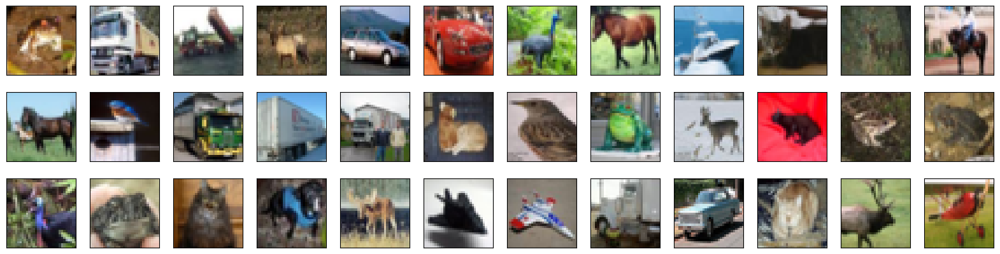

In [ ]:
import keras
from keras.datasets import cifar10
(x_train,y_train),(x_test,y_test)=cifar10.load_data()
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig = plt.figure(figsize = (20,5))
for i in range(36):
  ax = fig.add_subplot(3,12,i+1,xticks=[],yticks=[])
  ax.imshow(np.squeeze(x_train[i]))


In [ ]:
# convertendoimafens de 0-255 => 0-1
x_train = x_train.astype('float32')/255
x_test = x_test.astype('float32')/255

In [ ]:
#'one-hot encoding' capturando classes
# from keras.utils import np_utils
# num_classes = len(np.unique(y_train))
# y_train = keras.utils.to_categorical(y_train,num_classes)
# y_test = keras.utils.to_categorical(y_test,num_classes)
#descontinuada a np_utils
#'one-hot encoding' capturando classes
from keras.utils import to_categorical
num_classes = len(np.unique(y_train))
y_train = to_categorical(y_train,num_classes)
y_test = to_categorical(y_test,num_classes)


In [ ]:
# split data in training,validation and test
(x_train,x_valid) = x_train[5000:],x_train[:5000]
(y_train,y_valid) = y_train[5000:],y_train[:5000]

print('x_train shape:',x_train.shape)

print(x_train.shape[0],'train samples')
print(x_test.shape[0],'test samples')
print(x_valid.shape[0],'validation samples')

x_train shape: (45000, 32, 32, 3)
45000 train samples
10000 test samples
5000 validation samples


In [ ]:
# Mini AlexNet Architeture
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout
model = Sequential()
model.add(Conv2D(filters=16,kernel_size=2,padding='same',activation='relu',input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=2))

model.add(Conv2D(filters=32,kernel_size=2,padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=2))

model.add(Conv2D(filters=64,kernel_size=2,padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=2))

model.add(Dropout(0.3))

model.add(Flatten())

model.add(Dense(500,activation='relu'))
model.add(Dropout(0.4))

model.add(Dense(10,activation='softmax'))
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 32, 32, 16)          │             208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 16, 16, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 16, 16, 32)          │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 8, 8, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 8, 8, 64)            │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 500)                 │         512,500 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 500)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 10)                  │           5,010 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 528,054 (2.01 MB)

 Trainable params: 528,054 (2.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# copile  model
model.compile(loss='categorical_crossentropy',optimizer='rmsprop',metrics=['accuracy'])

In [ ]:
# train model
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='model.weights.best.keras',verbose=1,save_best_only=True)
hist = model.fit(x_train,y_train,batch_size=32,epochs=100,validation_data=(x_valid,y_valid),callbacks=[checkpointer],verbose=2,shuffle=True)

Epoch 1/100

Epoch 1: val_loss improved from inf to 1.37766, saving model to model.weights.best.keras
1407/1407 - 13s - 9ms/step - accuracy: 0.4268 - loss: 1.5846 - val_accuracy: 0.5056 - val_loss: 1.3777
Epoch 2/100

Epoch 2: val_loss improved from 1.37766 to 1.15789, saving model to model.weights.best.keras
1407/1407 - 5s - 3ms/step - accuracy: 0.5477 - loss: 1.2677 - val_accuracy: 0.5924 - val_loss: 1.1579
Epoch 3/100

Epoch 3: val_loss improved from 1.15789 to 1.11034, saving model to model.weights.best.keras
1407/1407 - 5s - 4ms/step - accuracy: 0.5947 - loss: 1.1387 - val_accuracy: 0.6072 - val_loss: 1.1103
Epoch 4/100

Epoch 4: val_loss improved from 1.11034 to 1.04737, saving model to model.weights.best.keras
1407/1407 - 5s - 3ms/step - accuracy: 0.6236 - loss: 1.0657 - val_accuracy: 0.6282 - val_loss: 1.0474
Epoch 5/100

Epoch 5: val_loss improved from 1.04737 to 0.91068, saving model to model.weights.best.keras
1407/1407 - 5s - 4ms/step - accuracy: 0.6437 - loss: 1.0133 - val

In [ ]:
# bestValidation
model.load_weights('model.weights.best.keras')

In [ ]:
# EvaluateModel
score = model.evaluate(x_test,y_test,verbose=0)
print('\n','Test acuracy',score[1])


 Test acuracy 0.6995999813079834


In [ ]:
def split_train_validation_test(dataset, train=70, validation=15, test=15):
    len_dataset = len(dataset)

    train_end = int(len_dataset * (train / 100))
    validation_end = train_end + int(len_dataset * (validation / 100))

    return (
        dataset[:train_end],               # Conjunto de treinamento
        dataset[train_end:validation_end], # Conjunto de validação
        dataset[validation_end:]           # Conjunto de teste
    )

############################# testes #################################

In [ ]:
import tensorflow as tf
import time

def benchmark(device, epochs=5):
    print(f"Testando em: {device}")
    with tf.device(device):
        model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(512, activation='relu', input_shape=(784,)),
            tf.keras.layers.Dense(512, activation='relu'),
            tf.keras.layers.Dense(10, activation='softmax')
        ])
        model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

        # Gerar dados aleatórios para teste
        import numpy as np
        x_train = np.random.rand(60000, 784).astype('float32')
        y_train = np.random.randint(0, 10, 60000)

        start_time = time.time()
        model.fit(x_train, y_train, epochs=epochs, batch_size=128, verbose=0)
        total_time = time.time() - start_time

    print(f"Tempo total em {device}: {total_time:.2f} segundos\n")
    return total_time

# Testar CPU
cpu_time = benchmark("/CPU:0")

# Testar GPU (se disponível)
gpu_time = None
if tf.config.list_physical_devices('GPU'):
    gpu_time = benchmark("/GPU:0")

# Testar TPU (se disponível)
tpu_time = None
try:
    tpu_resolver = tf.distribute.cluster_resolver.TPUClusterResolver.connect()
    strategy = tf.distribute.TPUStrategy(tpu_resolver)
    with strategy.scope():
        tpu_time = benchmark("/TPU:0")
except:
    print("TPU não disponível")

# Exibir pontuação
print("🚀 Resultados do Benchmark:")
print(f"CPU: {cpu_time:.2f} seg")
if gpu_time:
    print(f"GPU: {gpu_time:.2f} seg")
if tpu_time:
    print(f"TPU: {tpu_time:.2f} seg")

# Melhor desempenho recebe um "score"
scores = {"CPU": cpu_time}
if gpu_time:
    scores["GPU"] = gpu_time
if tpu_time:
    scores["TPU"] = tpu_time

best_device = min(scores, key=scores.get)
print(f"\n✅ Melhor configuração: {best_device} com {scores[best_device]:.2f} segundos.")


Testando em: /CPU:0


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


NotFoundError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 205, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-1-19a7c0eb84b4>", line 27, in <cell line: 0>

  File "<ipython-input-1-19a7c0eb84b4>", line 20, in benchmark

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 219, in function

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 132, in multi_step_on_iterator

could not find registered transfer manager for platform Host -- check target linkage
	 [[{{node StatefulPartitionedCall}}]] [Op:__inference_multi_step_on_iterator_1269]

* CPU: 56.93 seg
* GPU T4:
  * CPU: 51.61 seg
  * GPU: 9.98 seg
* TPU v2.8:
  * erro

In [ ]:
import tensorflow as tf
import time
import numpy as np

def benchmark(device, epochs=5):
    print(f"Testando em: {device}")

    # Criar dados sintéticos
    x_train = np.random.rand(60000, 784).astype('float32')
    y_train = np.random.randint(0, 10, 60000)

    dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(128)

    start_time = time.time()

    with tf.device(device):
        model = tf.keras.Sequential([
            tf.keras.layers.Input(shape=(784,)),  # Corrigindo o aviso do Input
            tf.keras.layers.Dense(512, activation='relu'),
            tf.keras.layers.Dense(512, activation='relu'),
            tf.keras.layers.Dense(10, activation='softmax')
        ])
        model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

        model.fit(dataset, epochs=epochs, verbose=0)

    total_time = time.time() - start_time
    print(f"Tempo total em {device}: {total_time:.2f} segundos\n")
    return total_time

# Testar CPU
cpu_time = benchmark("/CPU:0")

# Testar GPU (se disponível)
gpu_time = None
if tf.config.list_physical_devices('GPU'):
    gpu_time = benchmark("/GPU:0")

# Testar TPU (se disponível)
tpu_time = None
try:
    tpu_resolver = tf.distribute.cluster_resolver.TPUClusterResolver.connect()
    strategy = tf.distribute.TPUStrategy(tpu_resolver)
    with strategy.scope():
        tpu_time = benchmark("/TPU:0")
except Exception as e:
    print(f"Erro ao testar TPU: {e}")

# Exibir pontuação
print("🚀 Resultados do Benchmark:")
print(f"CPU: {cpu_time:.2f} seg")
if gpu_time:
    print(f"GPU: {gpu_time:.2f} seg")
if tpu_time:
    print(f"TPU: {tpu_time:.2f} seg")

# Melhor desempenho recebe um "score"
scores = {"CPU": cpu_time}
if gpu_time:
    scores["GPU"] = gpu_time
if tpu_time:
    scores["TPU"] = tpu_time

best_device = min(scores, key=scores.get)
print(f"\n✅ Melhor configuração: {best_device} com {scores[best_device]:.2f} segundos.")


Testando em: /CPU:0


NotFoundError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 205, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-2-a16b2f4537dc>", line 32, in <cell line: 0>

  File "<ipython-input-2-a16b2f4537dc>", line 25, in benchmark

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 219, in function

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 132, in multi_step_on_iterator

could not find registered transfer manager for platform Host -- check target linkage
	 [[{{node StatefulPartitionedCall}}]] [Op:__inference_multi_step_on_iterator_2491]

In [ ]:
!git clone https://github.com/matterport/Mask_RCNN

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956 (from 1)
Receiving objects: 100% (956/956), 137.67 MiB | 26.69 MiB/s, done.
Resolving deltas: 100% (558/558), done.


In [ ]:
import torch
print(torch.cuda.is_available())  # Deve retornar True no Colab
print(torch.cuda.get_device_name(0))  # Deve mostrar a GPU disponível

False


RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [ ]:
%pwd

'/content'

In [ ]:
%cd Mask_RCNN

/content/Mask_RCNN


In [ ]:
!python setup.py install

/content/Mask_RCNN/setup.py:9: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources
/usr/local/lib/python3.11/dist-packages/setuptools/dist.py:452: SetuptoolsDeprecationWarning: Invalid dash-separated options
!!

        ********************************************************************************
        Usage of dash-separated 'description-file' will not be supported in future
        versions. Please use the underscore name 'description_file' instead.

        This deprecation is overdue, please update your project and remove deprecated
        calls to avoid build errors in the future.

        See https://setuptools.pypa.io/en/latest/userguide/declarative_config.html for details.
        ********************************************************************************

!!
  opt = self.warn_dash_deprecation(opt, section)
/usr/local/lib/python3.11/dist-packages/setuptools/dist.py:452: Setuptoo

In [ ]:
%cd ..


/content


In [ ]:
import os
import sys
import random
import math
import cv2
import numpy as np
import skimage.io
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
!pip install --upgrade h5py==2.10.0

DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/mask_rcnn-2.1-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.1/301.1 kB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for h5py
  Running setup.py clean for h5py
Failed to build h5py
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (h5py)


 **Desenvolvimento Segmentacao imagens do milho**

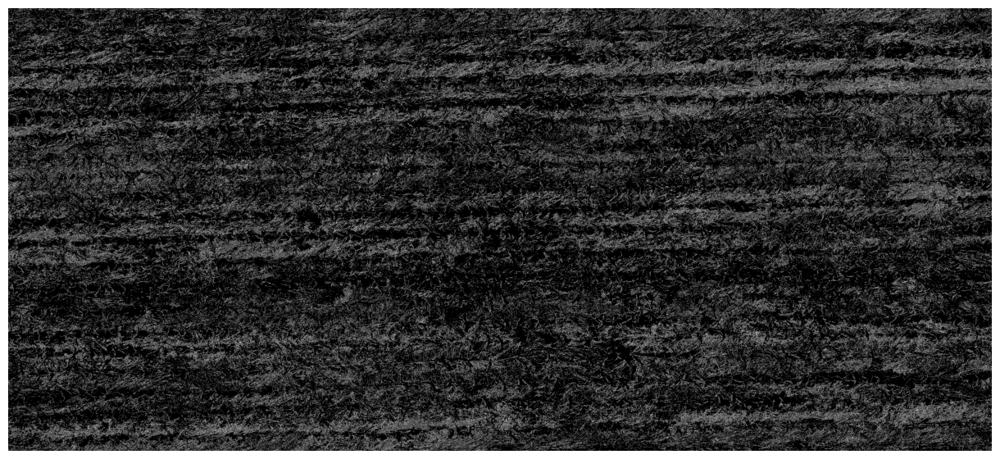

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import requests

# Baixar a imagem
ImgBytes = requests.get("https://raw.githubusercontent.com/AngeloDev-New/IC_Milho_Acompanhamento/refs/heads/main/img.png").content

# Converter bytes em array NumPy e decodificar para imagem
img_array = np.asarray(bytearray(ImgBytes), dtype=np.uint8)
img = cv2.imdecode(img_array, cv2.IMREAD_UNCHANGED)

# Converter para escala de cinza (ou manter o formato original com RGBA)
gray = cv2.cvtColor(img, cv2.COLOR_BGRA2RGBA)
r, g, b, a = cv2.split(gray)

# Salvar os valores originais (se necessário)
original_r = r.copy()
original_g = g.copy()
original_b = b.copy()
original_a = a.copy()

# Aplicar os ajustes de intensidade diretamente como NumPy
# r = (original_r * 0).astype(np.uint8)
r = np.where((r > 170), 255, 0).astype(np.uint8)  # Substituir por 0 onde g <= 100

g = (original_g * 1.0).astype(np.uint8)
g = np.where((g > 170) & (g < 200), g, 0).astype(np.uint8)  # Substituir por 0 onde g <= 100
b = (original_b * 0.0).astype(np.uint8)
a = (original_a * 1.0).astype(np.uint8)

# Combinar os canais novamente
gray = cv2.merge((r, g, b, a))
gray = cv2.cvtColor(gray, cv2.COLOR_RGBA2GRAY)
# Configurar o Matplotlib para exibir a imagem
plt.figure(figsize=(12, 8))  # Configura o tamanho da figura
plt.imshow(cv2.cvtColor(gray, cv2.COLOR_RGBA2RGB))  # Converte para RGB para exibição
plt.axis('off')  # Remove os eixos
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # Remove margens/bordas
plt.show()


**19/12** Nestes últimos dois dias, dediquei-me a aprofundar meus estudos no livro [Deep Learning for Vision Systems](https://www.manning.com/books/deep-learning-for-vision-systems), de Mohamed Elgendy. Meu foco agora será concluir o curso de [Segmentação de Imagens com Python de A a Z](https://www.udemy.com/course/segmentacao-imagens-python-a-z/?couponCode=ST21MT121624) e aplicar as técnicas aprendidas nele. Em seguida, pretendo me dedicar à leitura do livro [Mastering OpenCV 4 with Python](https://www.oreilly.com/library/view/mastering-opencv-4/9781789344912/), de Alberto Fernández Villán pois no mesmo  é utilizado o open CV4 oque atualiza meus conhecimentos do curso, alem disso estou me referenciando no livro [Python Para Análise de Dados: Tratamento de Dados com Pandas, NumPy e IPython](https://www.amazon.com.br/Python-Para-An%C3%A1lise-Dados-Tratamento/dp/8575226479) de Wes McKinney.

**16/12** aplicando
THRESH_BINARY
THRESH_BINARY_INN
THRESH_TRUNC
THRESH_TOZERO
THRESH_TOZERO_INN


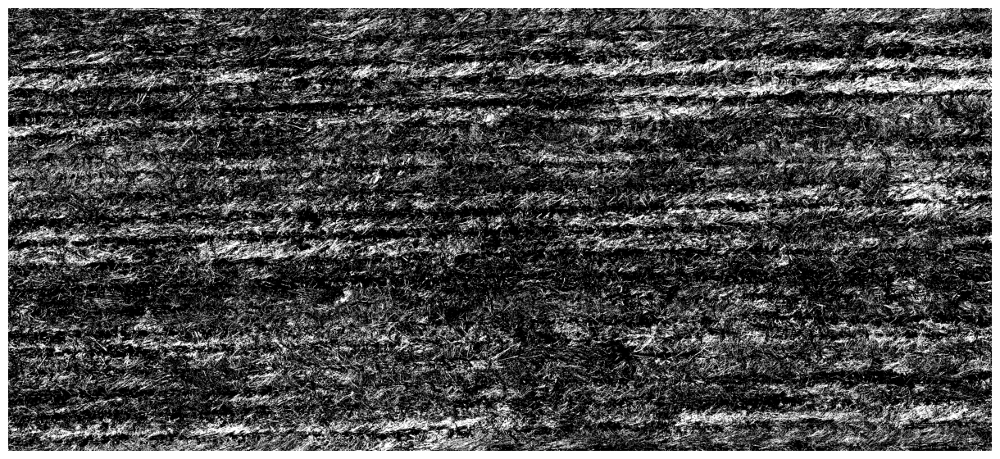

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import requests

# Baixar a imagem
ImgBytes = requests.get("https://raw.githubusercontent.com/AngeloDev-New/IC_Milho_Acompanhamento/refs/heads/main/img.png").content

# Converter bytes em array NumPy e decodificar para imagem
img_array = np.asarray(bytearray(ImgBytes), dtype=np.uint8)
img = cv2.imdecode(img_array, cv2.IMREAD_UNCHANGED)

# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGRA2GRAY)
limiar =170 #@param {type: "slider",min:0,max:255,steo:1}
#tudo acima do limiar recebe 255 e abaixo 0
val,tresh = cv2.threshold(gray,limiar,255,cv2.THRESH_BINARY)
# contrario do de cima
# val,tresh = cv2.threshold(gray,limiar,255,cv2.THRESH_BINARY_INV)
# fixa no teto limiar
# val,tresh = cv2.threshold(gray,limiar,255,cv2.THRESH_TRUNK)
# abaixo do limiar fica apreto
# val,tresh = cv2.threshold(gray,limiar,255,cv2.THRESH_TOZERO)
# acima do limiar fica preto
# val,tresh = cv2.threshold(gray,limiar,255,cv2.THRESH_TOZERO_INV)
gray = tresh

# Configurar o Matplotlib para tela cheia
plt.figure(figsize=(12, 8))  # Configura o tamanho da figura
plt.imshow(gray, cmap='gray')
plt.axis('off')  # Remove os eixos
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # Remove margens/bordas
plt.show()

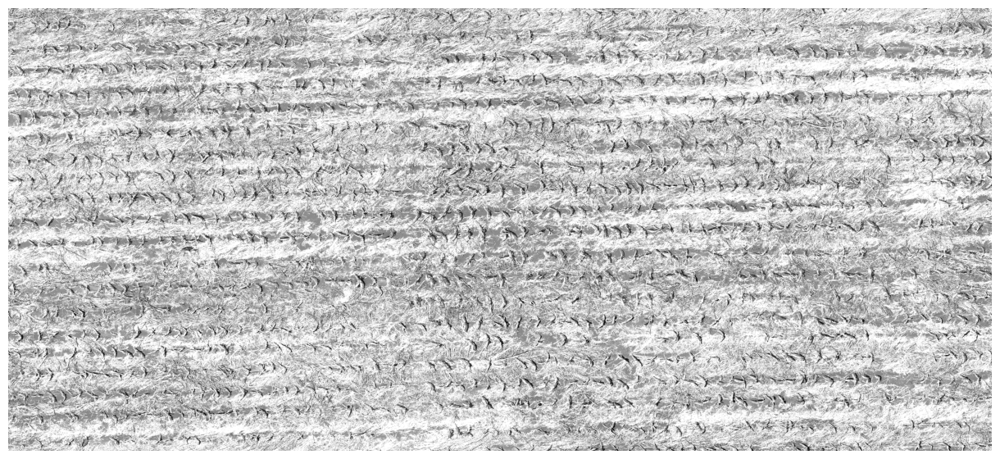

In [ ]:
limiar = 170
# var,thresh = cv2.threshold(gray,limiar,255,cv2.THRESH_BINARY_INV)
var,thresh = cv2.threshold(gray,limiar,255,cv2.THRESH_TRUNC)

mostrar(thresh)

**16/12** aplicando binarizacao basica na imagem (a nivel de aprendizados estes processos iniciais serao aplicados na imagem [img.png](https://raw.githubusercontent.com/AngeloDev-New/IC_Milho_Acompanhamento/refs/heads/main/img.png)) optei fazer tanto na mao pra entender a logica por traz quanto usando as facilidades do cv2


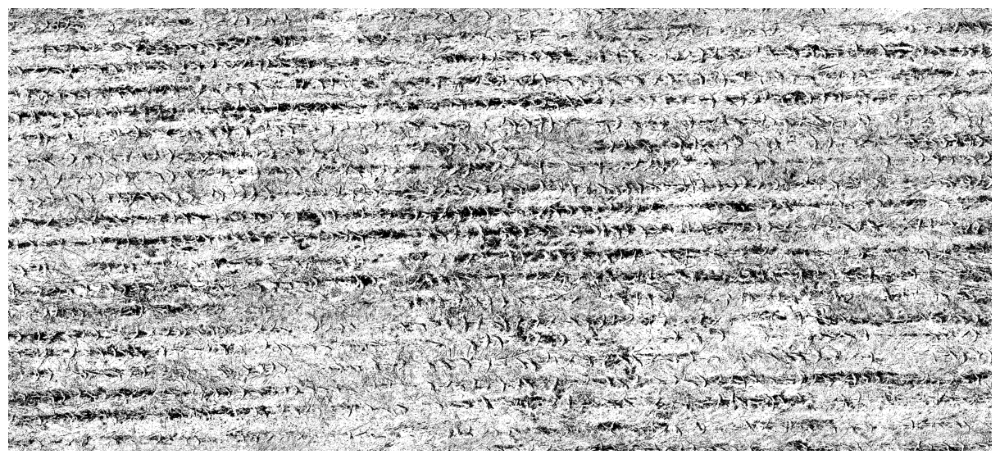

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import requests

# Baixar a imagem
ImgBytes = requests.get("https://raw.githubusercontent.com/AngeloDev-New/IC_Milho_Acompanhamento/refs/heads/main/img.png").content

# Converter bytes em array NumPy e decodificar para imagem
img_array = np.asarray(bytearray(ImgBytes), dtype=np.uint8)
img = cv2.imdecode(img_array, cv2.IMREAD_UNCHANGED)

# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGRA2GRAY)
limiar =100
gray = gray.astype(np.int8)
gray -= limiar
gray = (gray > 0)
gray = gray.astype(np.uint8)
# Configurar o Matplotlib para tela cheia
plt.figure(figsize=(12, 8))  # Configura o tamanho da figura
plt.imshow(gray, cmap='gray')
plt.axis('off')  # Remove os eixos
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # Remove margens/bordas
plt.show()

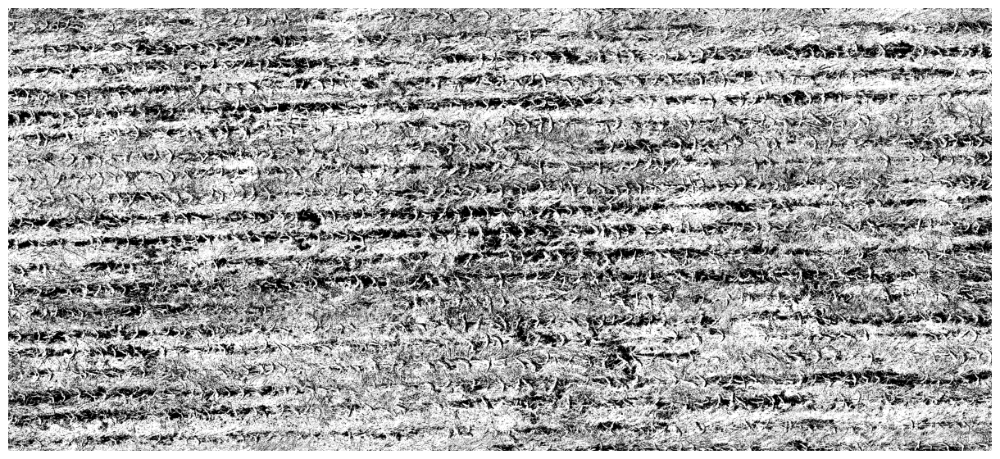

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import requests

# Baixar a imagem
ImgBytes = requests.get("https://raw.githubusercontent.com/AngeloDev-New/IC_Milho_Acompanhamento/refs/heads/main/img.png").content

# Converter bytes em array NumPy e decodificar para imagem
img_array = np.asarray(bytearray(ImgBytes), dtype=np.uint8)
img = cv2.imdecode(img_array, cv2.IMREAD_UNCHANGED)

# Converter para escala de cinza
gray = cv2.split(img)[1]
limiar =110
gray = gray.astype(np.int8)
gray -= limiar
gray = (gray > 0)
gray = gray.astype(np.uint8)
# Configurar o Matplotlib para tela cheia
plt.figure(figsize=(12, 8))  # Configura o tamanho da figura
plt.imshow(gray, cmap='gray')
plt.axis('off')  # Remove os eixos
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # Remove margens/bordas
plt.show()

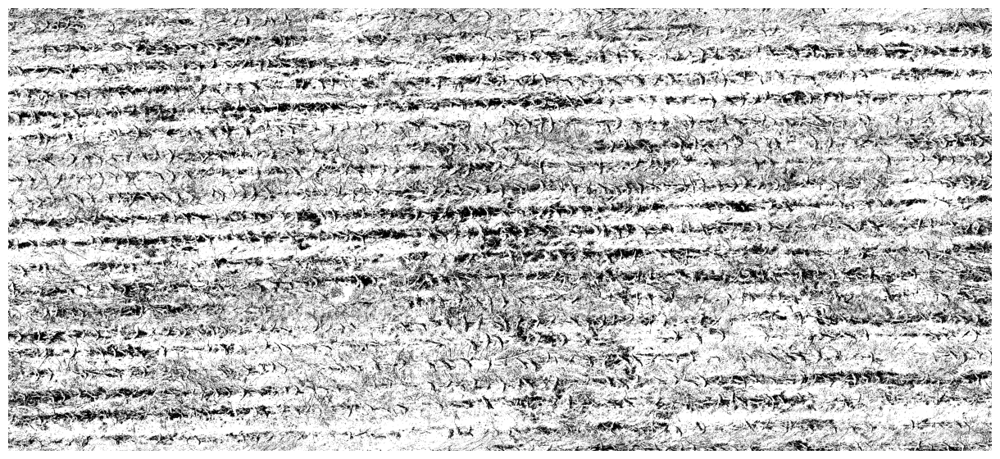

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import requests

# Baixar a imagem
ImgBytes = requests.get("https://raw.githubusercontent.com/AngeloDev-New/IC_Milho_Acompanhamento/refs/heads/main/img.png").content

# Converter bytes em array NumPy e decodificar para imagem
img_array = np.asarray(bytearray(ImgBytes), dtype=np.uint8)
img = cv2.imdecode(img_array, cv2.IMREAD_UNCHANGED)

# Converter para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGRA2GRAY)
limiar =23 #@param {type: "slider",min:0,max:255,steo:1}
val,tresh = cv2.threshold(gray,limiar,255,cv2.THRESH_BINARY)
gray = tresh

# Configurar o Matplotlib para tela cheia
plt.figure(figsize=(12, 8))  # Configura o tamanho da figura
plt.imshow(gray, cmap='gray')
plt.axis('off')  # Remove os eixos
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # Remove margens/bordas
plt.show()

**13/12** Analisando a estrutura da nossa documentação, percebi que, ao inverter a ordem de apresentação e deixar as novidades no topo, o conteúdo se tornaria mais visível para mim e mais legível para os interessados. Além disso, foi criado o arquivo [Readme.md](https://github.com/AngeloDev-New/IC_Milho_Acompanhamento/tree/main#readme) do projeto no Git.

**13/12** Limiarização ou binarização é um método aplicado em imagens monocromáticas, ou seja, em escala de cinza. Nesse processo, define-se um valor de limiar entre 0 e 255, onde todos os pixels com valores acima desse limiar são convertidos para 255 (branco), enquanto os valores abaixo são convertidos para 0 (preto).

In [ ]:
# open cv
import cv2
# numeros
import numpy as np
# ferramenta de plotagen de imagens e graficos
from matplotlib import pyplot as plt
# mostrar imagens geradas via terminal colab
from google.colab.patches import cv2_imshow
# acesso direto ao drive
from google.colab import drive
drive.mount("/content/gdrive")



Mounted at /content/gdrive


**12/12** Estamos enfrentando problemas de falta de memória, mas sem preocupação. A partir de agora, aplicarei técnicas aprendidas no curso [Segmentacao Imagens Python a-z](https://www.udemy.com/course/segmentacao-imagens-python-a-z/) fornecido pelo leo.

**12/12**
Conforme comentado no grupo de controle do WhatsApp, o protótipo inicial de segmentação não funcionou como o esperado. Contudo, foi uma rica fonte de aprendizado para mim. Pretendo continuar utilizando a base de carregamento como está, mas, com base no livro [Python para Análise de Dados](https://www.amazon.com.br/Python-Para-An%C3%A1lise-Dados-Tratamento/dp/8575226479/ref=sr_1_2?adgrpid=1141293730226964&dib=eyJ2IjoiMSJ9.UYPX3cU1vlR1g5ka256QBQFSnrYDxyHANJrJMX9Syr8pwzZOp0B8yEITq9VdYiiFJPoSckle3TnBiUbvNmT97BnvEmej5nt-4ZlmR5m-iGLmxmpH5kVKWaECiT93S7_6fws2uCMqGm6Zsd36qxiQ3JIJVlpsBs-WPU5rJ7zliOtnvn5iAKUZmZxG-VPf-mnC0n-XA6CG842poP7R5n0q6qgwfNRrEu8w1oFPMxvj1J1GoAgLI-3H8M6eeUP-RN443_Mlkb0Y6S00ldXXocMDqL61A2Cu8wudO_oBvJF_8GaWWp8LOEdc6ZC1I_fNBFsGem5vsF_IyZdZf_vwEPfK67HkMGS9f3LhuKKpurFe_PgUXd9H6dstCGTNXkIZy4BFnNBPDEE1IoqUiDxlooM4y-OjK445utdsb9AHwQupI377dIFanLdFb_QnbzOiOG-e.UXyuego9Sj3dOlkieXC62FCJj61sJtr77BD7x_qJ4sg&dib_tag=se&hvadid=71330944898389&hvbmt=be&hvdev=c&hvlocphy=184997&hvnetw=o&hvqmt=e&hvtargid=kwd-71331374786960%3Aloc-20&hydadcr=5714_11235317&keywords=python+para+an%C3%A1lise+de+dados+wes+mckinney&qid=1734019643&sr=8-2), que estou usando como referência de estudo, transformarei as imagens em arrays do NumPy. Essa abordagem permitirá melhorar significativamente a performance em futuras transformações, geração de máscaras e outras operações.

In [ ]:
# !pip install zipfile
# !sudo apt-get install unrar
# !pip uninstall pillow
# !pip install pillow --upgrade --force-reinstall
# # !pip install pillow
import gc
import zipfile
import io
import requests
from PIL import Image
import subprocess
import numpy as np
Image.MAX_IMAGE_PIXELS = None
def base_de_carregamento(nImagensAResgatar = None):


  def carregarLocal():
    with open("names.txt","r") as names:
      namelisted = names.readlines()
      if nImagensAResgatar != None:
        namelisted = namelisted[:nImagensAResgatar]
    for imagen in namelisted:
        with open(imagen.replace("/","//").replace("\n",""),"rb") as image:
          yield image.read()
  imagens = []
  try:
    for imagenBTS in carregarLocal():
      imagens.append(io.BytesIO(imagenBTS))
  except:
    print("arquivos nao encontrados no local, baixando do drive")
    link = "https://drive.usercontent.google.com/download?id=10CBH3mAWwEw7RLEENgR9SCPpax2Hq9wm&export=download&confirm=t&uuid=60710c25-dc1c-4b9a-8c04-5cb5e30cf482&at=APvzH3o-oEV6bYbNetICf4FTSsvc%3A1733885388620"
    response = requests.get(link)
    response.raise_for_status()
    print(len(response.content),"bytes baixados")
    bts = io.BytesIO(response.content)
    with zipfile.ZipFile(bts) as zf:
      zf.extractall()
      with open("names.txt","w") as names:
        names.write("\n".join(zf.namelist()[1:]))
    for imagenBTS in carregarLocal():
      imagens.append(io.BytesIO(imagenBTS))
  if len(imagens) == 1:
    return imagens[0]
  return imagens
  # o codigo acima nao esta comentado pois ja foi comentado no exemplo acima
################################
# apartir de aqui e codigo novo#
################################

imagem = Image.open(base_de_carregamento(1))

largura,altura = imagem.size
largura/=9
altura/=9
imagemar = np.array(imagem)[1]
del imagem
gc.collect()
Image.fromarray(imagemar).resize((int(largura),int(altura))).save("imagem_redimensionada.png")
# array_imagens = [np.array(imagen) for imagen in imagens]


**11/12** **Descrição do Software**
O software foi desenvolvido para processar imagens compactadas em um arquivo ZIP armazenado no Google Drive e gerar um mapa vetorial indicando os segmentos de interesse com base na transparência dos pixels.

Funcionalidades Principais
Download e Descompactação:

A biblioteca requests é utilizada para baixar o arquivo compactado diretamente do Google Drive.
O conteúdo do arquivo ZIP é extraído usando zipfile, com io manipulando os dados em buffer para evitar acessos desnecessários ao disco.
Processamento de Imagens:

As imagens TIFF descompactadas são analisadas pela biblioteca Pillow (PIL).
O software percorre cada imagem como um mapa, identificando áreas onde a transparência é inferior a 30% dos pixels.
Geração do Mapa Vetorial:

A partir da análise, é gerado um mapa vetorial que indica as regiões segmentadas de interesse.
Este mapa vetorial serve como uma representação compacta e eficiente das áreas a serem capturadas, reduzindo o uso de armazenamento e facilitando o processamento posterior.
Automação com Comandos Externos:

A biblioteca subprocess é utilizada para executar comandos automatizados que complementam o fluxo de trabalho, quando necessário.
Fluxo de Operação
O software faz o download do arquivo ZIP armazenado no Google Drive.
Os arquivos TIFF são descompactados em buffer, evitando gravações intermediárias no disco.
Cada imagem é processada, identificando segmentos com transparência inferior a 30%.
Um mapa vetorial é gerado, representando as áreas relevantes para captura.
Resultado
O resultado final é um mapa vetorial que destaca as regiões segmentadas nas imagens. Este mapa pode ser utilizado para análises posteriores ou integrado a outros sistemas que demandem uma representação precisa e eficiente dos dados processados.

In [ ]:
# !pip install zipfile
# !sudo apt-get install unrar
# !pip uninstall pillow
# !pip install pillow --upgrade --force-reinstall
# # !pip install pillow
import zipfile
import io
import requests
from PIL import Image
import subprocess
# caso essa variavel nao seja definida como None as "tifs" ultrapassam o limite maximo de pixe default
Image.MAX_IMAGE_PIXELS = None
# funcao carrega as imagens contidas no disco
def carregarLocal():
  # arquivo usado para identificar o nome das imagens salvas
  # o mesmo e criado na primeira execuçao do codigo quando os tifs ainda nao foram descarregados
  with open("names.txt","r") as names:
    namelisted = names.readlines()
  # percorre o arquivo buscando a abertura de todos os nome nele contidos
  for imagen in namelisted:
      with open(imagen.replace("/","//").replace("\n",""),"rb") as image:
  # retorna o binario de cada um deles
        yield image.read()
# lista quee armazenara as imagens carregadas do disco
imagens = []
try:
  # tenta carregar localmente as imagens
  for imagenBTS in carregarLocal():
    imagens.append(io.BytesIO(imagenBTS))
# caso nao encontre localmente ele descarrega descompacta e salva a imagen em disco
except:
  print("arquivos nao encontrados no local, baixando do drive")
  link = "https://drive.usercontent.google.com/download?id=10CBH3mAWwEw7RLEENgR9SCPpax2Hq9wm&export=download&confirm=t&uuid=60710c25-dc1c-4b9a-8c04-5cb5e30cf482&at=APvzH3o-oEV6bYbNetICf4FTSsvc%3A1733885388620"
  response = requests.get(link)
  response.raise_for_status()
  print(len(response.content),"bytes baixados")
  bts = io.BytesIO(response.content)
  with zipfile.ZipFile(bts) as zf:
    zf.extractall()
    with open("names.txt","w") as names:
      names.write("\n".join(zf.namelist()[1:]))
    # apos gravar as imagens em disco as mesmas sao carregadas do local
    # sei que estou sendo redundante e ja que ja estao em memoria poderia simplesmente carrecarlas diretament edo buffer mas optei por fazer dessa forma para deixar mais legivel a intencao do codigo
  for imagenBTS in carregarLocal():
    imagens.append(io.BytesIO(imagenBTS))


def newArea(sections,size,dispercao = (10,10)):
    # sections == tamanho das imagens de saida
    # size == tamanho total do tif
    xdisp,ydisp = dispercao
    largura,altura = sections
    width,height  = size
    for x in range(width):
        for y in range(height):
            if x%xdisp == 0 and y%ydisp == 0:
                left = x
                upper = y
                right = x+largura
                lower = y+altura
                yield (left,upper,right,lower)
def aproved(image,usability):
    if image.mode != "RGBA":
        return True
    width,height  = image.size
    total = width*height
    transparentes = 0
    for x in range(width):
        for y in range(height):
            r,g,b,a = image.getpixel((x,y))
            if a < 10:
                transparentes += 1
                if transparentes > total*usability:
                    return False


def getSegmentos(img,sections,dispercao,USABLE):
  for area in newArea(sections,img.size):
    segmento = img.crop(area)
    if aproved(segmento,USABLE):
      yield segmento

for imagem in imagens:
  with Image.open(imagem,formats=["TIFF"]) as img:
    print(*getSegmentos(
        img=img,sections = (1000,1000),
        dispercao = (10,10),
        USABLE = 0.7),sep="\n")
    print("nSegments")


arquivos nao encontrados no local, baixando do drive
3400195099 bytes baixados


KeyboardInterrupt: 